In [ ]:
import sys
import os
sys.path.append("/home/nathan/dev/UmmonDevEnv/")
import matplotlib.pyplot as plt
from UDE.util.fuzzy import fuz
from UDE.util.converter import MaskConverter
import segmentation_models as sm
import numpy as np
import imgaug.augmenters as iaa
import tensorflow as tf
from PIL import Image
import cv2
from datetime import datetime

In [176]:
%load_ext tensorboard

In [174]:
# rotation starts here !

In [4]:
path = "/home/nathan/Desktop/data/dl_data/segmentation_dapi/"

In [433]:
os.chdir(path)
x = fuz.fuzzyopen(os.listdir()[0])

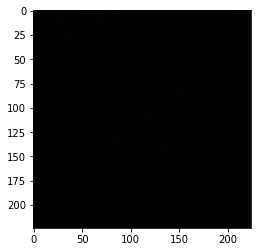

In [434]:
plt.imshow(x)

In [435]:
model = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)

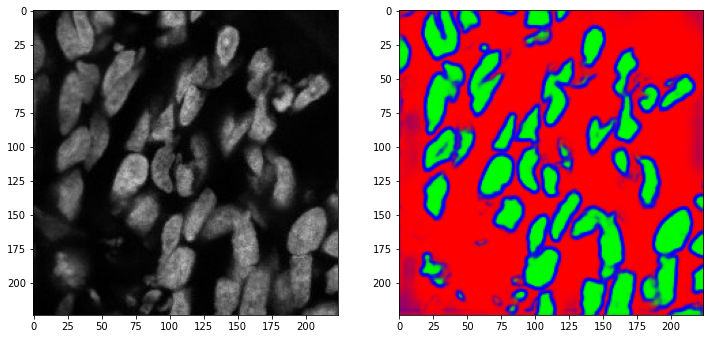

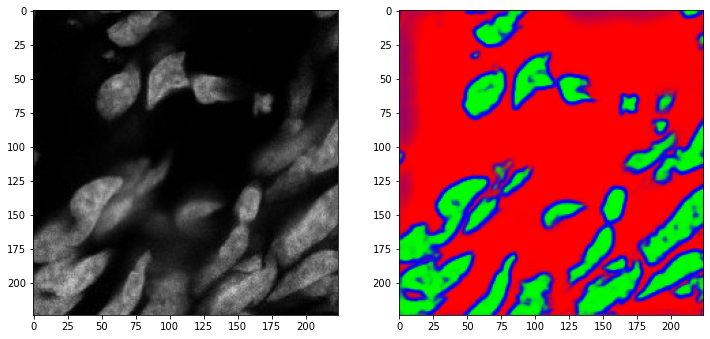

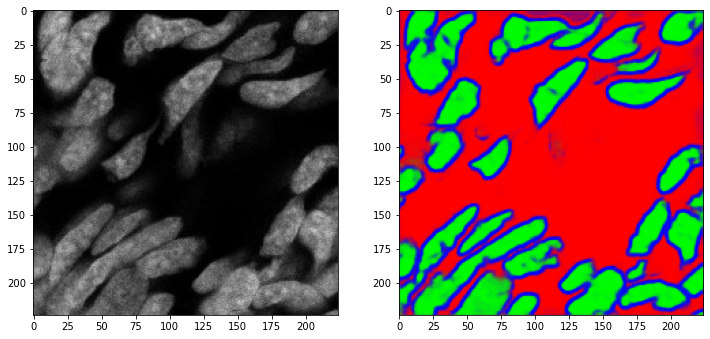

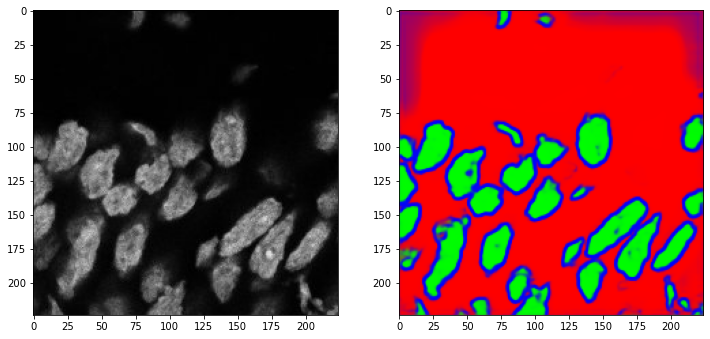

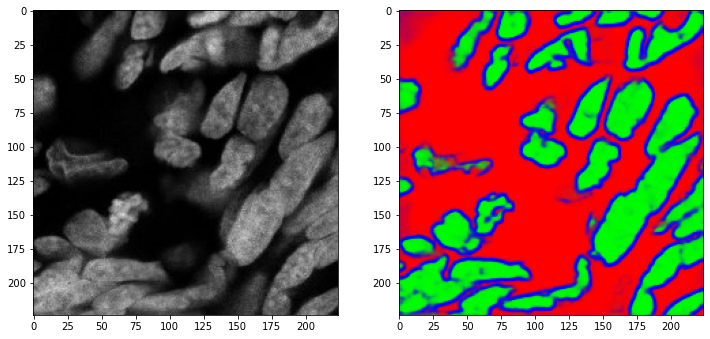

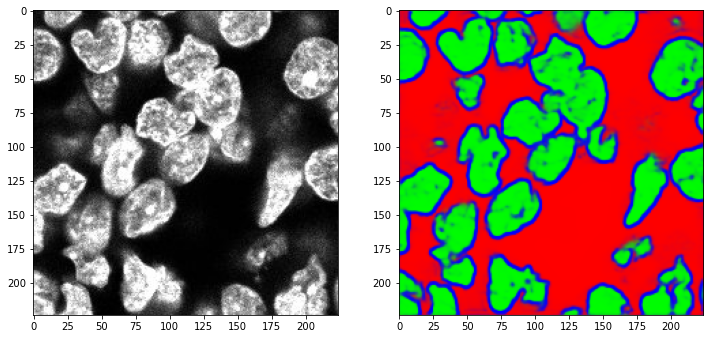

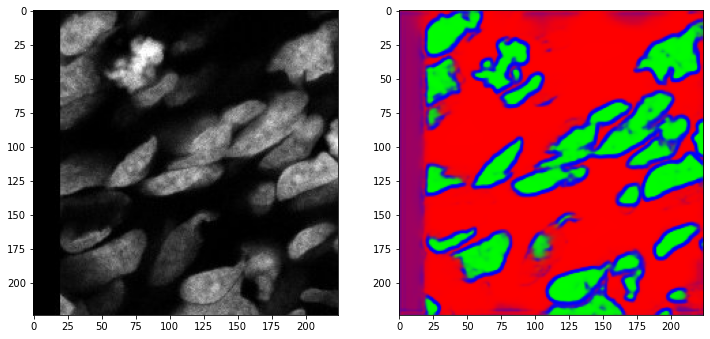

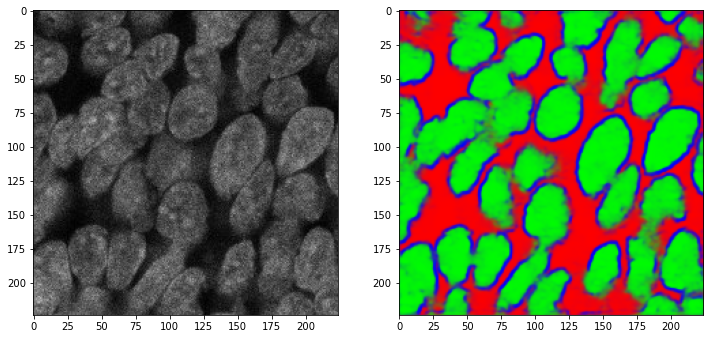

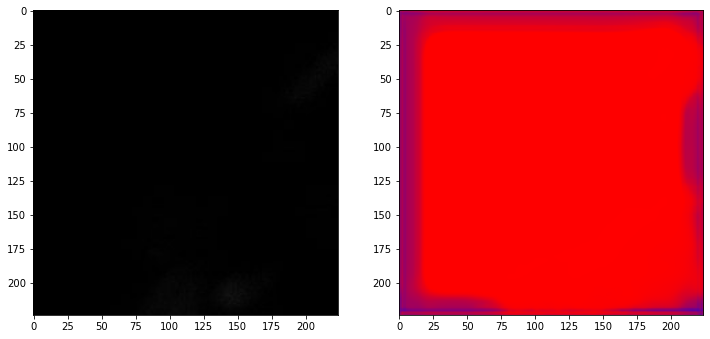

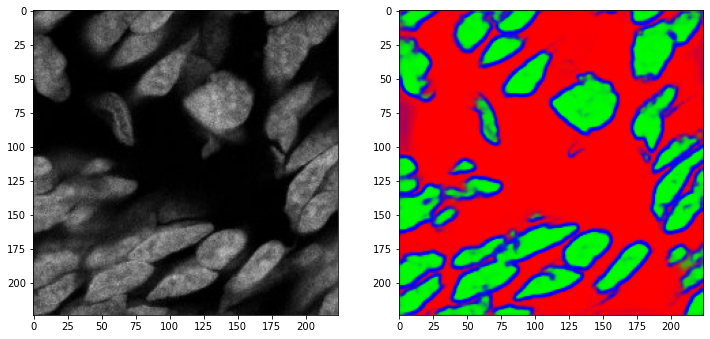

In [436]:
# model.load_weights('../models/save_seg_16_12_man83.hdf5')
model.load_weights("/home/nathan/Desktop/data/dl_data/monitoring/generator_model_9.h5")
images = [x for x in os.listdir() if "mask" not in x]
for i in range(10, 20):
    x = fuz.fuzzyopen(images[i])
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(x)
    plt.subplot(1, 2, 2)
    y = model.predict(np.array([x / 255.]))
    plt.imshow(y[0])
    plt.show()

In [437]:
m = MaskConverter(y[0])
m.argmax()
convd = {
    0: [0] * 3,
    1: [33] * 3,
    2: [0] * 3, # use 0 instead of 12
}
img = m.convert_from_dict(convd, lastchannel_shape=(3,), as_image=True)

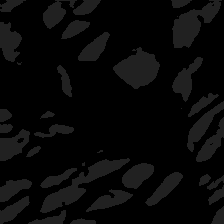

In [438]:
img

In [439]:
# make all predictions
inp = []
os.chdir(path)
images = [x for x in os.listdir() if "mask" not in x]
for x in images:
    inp.append(fuz.fuzzyopen(x) / 255.)

    
y = model.predict(np.array(inp))

In [440]:
y = list(y)

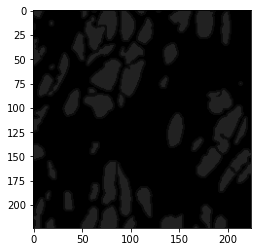

array([ 0, 12, 33], dtype=uint8)

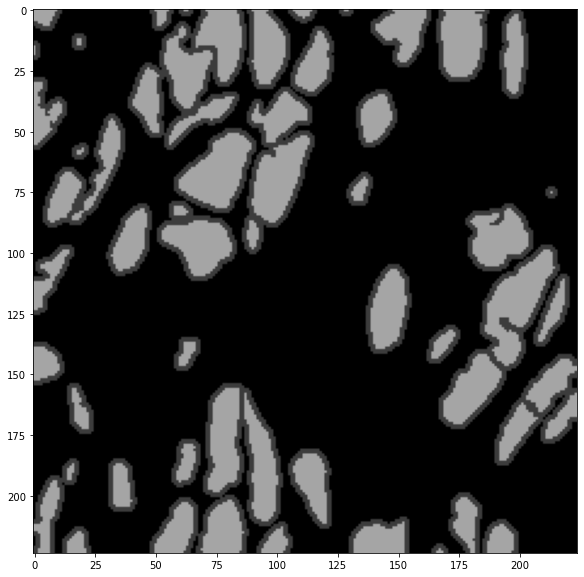

In [10]:
# function to autoborder
def autoborder(image): # returns PIL Image
    img_arr = np.asarray(image).copy()
    img_arr[img_arr != 33] = 0
    fin_arr= img_arr.copy()
    border = cv2.Canny(img_arr, 10, 12) # test these values
    
    sobelx64f = cv2.Laplacian(img_arr,cv2.CV_64F)
    abs_sobel64f = np.absolute(sobelx64f)
    aug = np.uint8(abs_sobel64f[:,:,0] > 0)
    
    aug = cv2.dilate(aug, np.ones((3,3),np.uint8), iterations=1)

    img_arr[aug > 0, :] = np.array([12]*3)
    fin_arr = np.maximum(fin_arr, img_arr)
    
    return Image.fromarray(fin_arr)

clear_pat(".")
masks = [x for x in os.listdir() if "mask" in x]
a = Image.open(masks[0])
auto = autoborder(a)
plt.imshow(a)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(Image.fromarray(np.asarray(auto) * 5))
np.unique(auto)

In [442]:
# convert for manual correction 
# we shall keep only "inside cell" channel and do not care about the rest
for x_, y_ in zip(images, y):
    m = MaskConverter(y_)
    m.argmax()
    img = m.convert_from_dict(convd, lastchannel_shape=(3,), as_image=True)
    name = x_.split('.')[0] + '_mask.' + x_.split('.')[1]
    img.save(name)

## manual correction step

In [5]:
# be sure to be in 
os.chdir("/home/nathan/Desktop/data/dl_data/segmentation_dapi_manual_label/")

In [6]:
# move manual mask to another dir
import shutil
is_done = lambda name: "e16064802166" in name or True
src = "/home/nathan/Desktop/data/dl_data/segmentation_dapi/"
src = "/home/nathan/Desktop/data/dl_data/selected_for_labelling/"
dst = "/home/nathan/Desktop/data/dl_data/segmentation_dapi_manual_label/"

# TODO export to UDE util
def mover(dir_src, dir_dst, which=lambda: True):
    for f in os.listdir(src):
        if which(f):
            src_f = src + f
            dst_f = dst + f
            shutil.move(src_f, dst_f)
            
mover(src, dst, which=is_done)

In [11]:
# automatical inference of the borders, as in segmenter notebook
clear_pat(".")
masks = [x for x in os.listdir() if "mask" in x]

for mask in masks:
    img = Image.open(mask)
    img = autoborder(img)
    img.save(mask)

In [8]:
# TODO export to UDE util
def clear_pat(dirname):
    for f in os.listdir(dirname):
        if ("watershed_mask" in f) or ("color_mask" in f) or ("mask_mask" in f):
            os.remove(os.path.join(dirname, f))
clear_pat(dst)
clear_pat(src)

In [12]:
# TODO export to UDE util
def toggle_mask(name):
    if "_mask" in name:
        return name.replace("_mask", "")
    else:
        ret_name = name.rsplit('.', maxsplit=1)[0] + '_mask.' + name.rsplit('.', maxsplit=1)[-1]
        if name != ret_name.replace("_mask", ""):
            raise ValueError("Could not add mask to the file %s, got %s" % (name, ret_name))
            
        return ret_name

In [13]:
convd = {
    0: [0] * 3,
    1: [33] * 3,
    2: [12] * 3,
}

reverse_convd = {tuple(v): k for k, v in convd.items()}

def quickload(im_mask):
    m = MaskConverter(im_mask)
    mask = m.convert_from_dict(reverse_convd, lastchannel_shape=(), cval=0)
    return mask

In [37]:
# train again splitting 0.8
# using augmentation

augmentation_policy =  iaa.Sequential([
    iaa.ScaleX(scale=(0.8, 1.2)),
    iaa.ScaleY(scale=(0.8, 1.2)),
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Rot90([0, 1, 2, 3]),
    # iaa.PiecewiseAffine(scale=(0.0, 0.04), nb_rows=(2, 4), nb_cols=(2, 4)),
    # iaa.pooling.AveragePooling(kernel_size=(1, 2)),
])


import numpy as np
import keras

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, batch_size=4, dim=(224,224), n_channels=3,
                 n_classes=3, shuffle=True, augmenter=None):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.augmenter = augmenter
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels), dtype=float)
        y = np.empty((self.batch_size, *self.dim, self.n_classes), dtype=np.int32)

        # Generate data
        for i, p in enumerate(list_IDs_temp):
            # Store sample
            X_ = fuz.fuzzyopen(p)[:224,:224,:3] / 255.

            # Store class
            mask = fuz.fuzzyopen(toggle_mask(p))
            mask = quickload(mask)
            y_ = keras.utils.to_categorical(mask, num_classes=self.n_classes)
            
            X[i,], y[i,] = X_, y_
            
        if self.augmenter:
            X, y = self.augmenter(images=X, segmentation_maps=y)

        return X, y.astype('float')

In [38]:
gen_path = "/home/nathan/Desktop/data/dl_data/segmentation_dapi_manual_label/"
os.chdir(gen_path)
list_ids = [x for x in os.listdir(gen_path) if "_mask" not in x]
split = len(list_ids) # int(0.8 * len(list_ids))
batch_size = 4

gen = DataGenerator(list_ids[:split], augmenter=augmentation_policy, batch_size=batch_size)
valgen = DataGenerator(list_ids[split:], augmenter=augmentation_policy, batch_size=batch_size)
print(len(gen), len(valgen))

30 0


In [64]:
x[0, :2, :10]

array([[[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.21188725, 0.21188725, 0.21188725],
        [0.37793352, 0.37793352, 0.37793352],
        [0.41390931, 0.41390931, 0.41390931],
        [0.43158701, 0.43158701, 0.43158701],
        [0.43847273, 0.43847273, 0.43847273],
        [0.44010417, 0.44010417, 0.44010417]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.23153339, 0.23153339, 0.23153339],
        [0.4182598 , 0.4182598 , 0.4182598 ],
        [0.42997089, 0.42997089, 0.42997089],
        [0.42776118, 0.42776118, 0.42776118],
        [0.40772825, 0.40772825, 0.40772825],
        [0.491322  , 0.491322  , 0.491322  ]]])

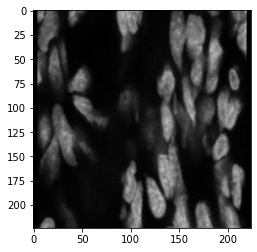

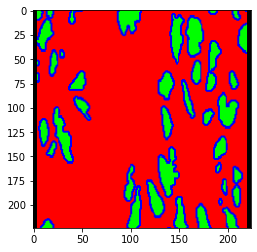

In [16]:
x, y = gen[0]
plt.imshow(x[0])
plt.show()
plt.imshow(y[0])

In [319]:
model = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)
model.load_weights('../models/model_unet_b0_0412_score_75_bowl.hdf5')
model.compile(optimizer="Adam", loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
ckp = tf.keras.callbacks.ModelCheckpoint(
    "../models/save_seg_21_12_man104_{epoch}", monitor='val_iou_score', verbose=1, save_best_only=False,
    save_weights_only=True, mode='max', save_freq='epoch', options=None
)

logdir = "/home/nathan/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [320]:
model.fit(x=gen, validation_data=valgen, epochs=40, callbacks=[ckp, tensorboard_callback])

Epoch 1/40
41/41 [==============================] - ETA: 0s - loss: 0.7695 - iou_score: 0.5832
Epoch 00001: saving model to ../models/save_seg_21_12_man104_1
41/41 [==============================] - 64s 2s/step - loss: 0.7695 - iou_score: 0.5832 - val_loss: 0.6094 - val_iou_score: 0.6172
Epoch 2/40
41/41 [==============================] - ETA: 0s - loss: 0.6560 - iou_score: 0.5856
Epoch 00002: saving model to ../models/save_seg_21_12_man104_2
41/41 [==============================] - 59s 1s/step - loss: 0.6560 - iou_score: 0.5856 - val_loss: 0.5794 - val_iou_score: 0.6286
Epoch 3/40
41/41 [==============================] - ETA: 0s - loss: 0.6569 - iou_score: 0.5924
Epoch 00003: saving model to ../models/save_seg_21_12_man104_3
41/41 [==============================] - 58s 1s/step - loss: 0.6569 - iou_score: 0.5924 - val_loss: 0.5125 - val_iou_score: 0.6483
Epoch 4/40
41/41 [==============================] - ETA: 0s - loss: 0.6391 - iou_score: 0.5879
Epoch 00004: saving model to ../models

In [294]:
model.load_weights("../models/save_seg_15_12_man83_20")

In [296]:
model.evaluate(valgen)

8/8 [==============================] - 7s 908ms/step - loss: 0.3972 - iou_score: 0.7144


[0.3972254693508148, 0.7143898010253906]

In [297]:
model.save_weights("../models/save_seg_16_12_man83.hdf5")

## Segmentation using GAN

Now that we have enough samples (between 100 and 200), we can consider using a GAN to fine tune our U-net model and have more realistic prediction. This is supposed to prevent the model from predicting an average of what could be possible.

This should be useful because our annotations are very imperfect because either a stain is a cell shall be defined as a cell or not is quite experimentator-dependant. However, we only care about cells that are properly labelled, because other will be removed because of their low signal.

Todolist:
- Make a discriminator model with a efficientnet
- Make a generator model using U-net
- Make a GAN model using both of them


To set multiple output and multiple loss  
1) Name the output layer in order to find it back  
2) Define the loss and loss weight from the name of the output  
```python 
losses = {
	"category_output": "categorical_crossentropy",
	"color_output": "categorical_crossentropy",
}
lossWeights = {"category_output": 1.0, "color_output": 1.0}
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights,
	metrics=["accuracy"])
```
3) Fit using multiple categories
```python
H = model.fit(x=trainX,
	y={"category_output": trainCategoryY, "color_output": trainColorY},
	validation_data=(testX,
		{"category_output": testCategoryY, "color_output": testColorY}),
	epochs=EPOCHS,
	verbose=1)
```

To do it fom sequence, I think we shall do :
`return X, {"mask_layer": mask, "discriminator_layer": disc}` instead of `return X, y`

In [48]:
import gc
gc.collect()

964751

In [49]:
# We should concatenate the image with the segmentation map so as the discriminator can help
# the generator finding the right configuration for a specific image, and no only having a great shape


import tensorflow as tf
discriminator = tf.keras.applications.efficientnet.EfficientNetB0(classes=2, weights=None,
                                                                  input_shape=(224, 224, 3))
opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator.compile(loss='binary_crossentropy', optimizer=opt)

In [50]:
generator = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)
generator.load_weights('../models/model_unet_b0_0412_score_75_bowl.hdf5')
generator.compile(optimizer="Adam", loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

In [51]:
def define_gan(generator, discriminator):
    discriminator.trainable = False
    gan_output = discriminator(generator.output)
    model = tf.keras.models.Model(generator.input, gan_output)
    opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model
    
GAN = define_gan(generator, discriminator)

In [52]:
def generate_d_samples(gen, valgen, g_model, batch_size=4):
    a = np.random.randint(len(gen))
    b = np.random.randint(len(valgen))
    pick_a, pick_b = np.random.randint(2), np.random.randint(2)
    half = int(batch_size / 2)
    output_fake = g_model.predict(gen[a][0])[pick_a * half:(pick_a + 1) * half]
    output_real = valgen[b][0][pick_b * half:(pick_b + 1) * half]
    X = np.array(list(output_fake) + list(output_real))
    y = np.array([[0] for i in range(half)] + [[1] for i in range(half)])
    return X, y

In [53]:
os.getcwd()

'/home/nathan/Desktop/data/dl_data/segmentation_dapi_manual_label'

In [54]:
def viz_segment(segmenter, valgen, idx=0, name=None):
    plt.figure(figsize=(9, 12))
    image0, gt0 = valgen[0]
    image1, gt1 = valgen[1]
    image2, gt2 = valgen[2]
    image = np.concatenate((image0, image1, image2))
    gt = np.concatenate((gt0, gt1, gt2))
    preds = segmenter.predict(image)
    # show 4 pictures
    n_pic = 4
    for i in range(n_pic):
        plt.subplot(n_pic, 3, i*3 + 1)
        plt.imshow(image[i])
        plt.subplot(n_pic, 3, i*3 + 2)
        plt.imshow(gt[i])
        plt.subplot(n_pic, 3, i*3 + 3)
        plt.imshow(preds[i])
        
    if name:
        plt.savefig("/home/nathan/Desktop/data/dl_data/monitoring/" + name)

In [55]:
# viz_segment(generator, gen, name="test.png")

In [56]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, gen, valgen, n_epochs=40, n_batch=4):
    root = "/home/nathan/Desktop/data/dl_data/monitoring/"
    bat_per_epo = len(gen)
    
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # train segmentation for generator
            batch = gen[j]
            seg_loss, _ = g_model.train_on_batch(x=batch[0], y=batch[1])
            
            # generate examples
            X_sample, y_sample = generate_d_samples(gen, gen, g_model)
            # update discriminator model weights
            d_loss = d_model.train_on_batch(X_sample, y_sample)

            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(gen[j][0], y_gan)
            # twice just to see
            g_loss = gan_model.train_on_batch(gen[j][0], y_gan)
            # print(seg_loss, d_loss, g_loss)
            # summarize loss on this batch
            print('>%d, %d/%d, d=%.3f, g=%.3f, s=%.3f' %
                (i+1, j+1, bat_per_epo, d_loss, g_loss, seg_loss))
            
        # SAVE ALL MODEL
        g_model.save_weights(root + f'generator_model_twice_{i}.h5')
        d_model.save_weights(root + f'discriminator_model_twice_{i}.h5')
        gan_model.save_weights(root + f'gan_model_twice_{i}.h5')
        
        viz_segment(generator, gen, idx=0, name=f"image_gan_twice_{i}.png")

>1, 1/30, d=1.964, g=0.693, s=1.080
>1, 2/30, d=4.776, g=0.693, s=1.691
>1, 3/30, d=3.626, g=0.697, s=1.165
>1, 4/30, d=2.643, g=0.698, s=1.009
>1, 5/30, d=2.579, g=0.701, s=1.004
>1, 6/30, d=1.273, g=0.695, s=0.970
>1, 7/30, d=1.627, g=0.695, s=0.736
>1, 8/30, d=3.442, g=0.704, s=0.787
>1, 9/30, d=0.993, g=0.738, s=1.052
>1, 10/30, d=3.650, g=0.740, s=0.807
>1, 11/30, d=3.230, g=0.727, s=0.677
>1, 12/30, d=2.048, g=0.702, s=0.577
>1, 13/30, d=0.962, g=0.705, s=0.634
>1, 14/30, d=1.193, g=0.707, s=0.694
>1, 15/30, d=1.622, g=0.698, s=0.744
>1, 16/30, d=2.730, g=0.703, s=0.488
>1, 17/30, d=1.631, g=0.708, s=0.687
>1, 18/30, d=1.205, g=0.780, s=0.746
>1, 19/30, d=2.158, g=0.809, s=0.996
>1, 20/30, d=1.005, g=0.752, s=0.709
>1, 21/30, d=1.033, g=0.761, s=0.582
>1, 22/30, d=1.729, g=0.800, s=0.670
>1, 23/30, d=1.295, g=0.695, s=0.609
>1, 24/30, d=2.964, g=0.709, s=0.546
>1, 25/30, d=2.117, g=0.955, s=0.582
>1, 26/30, d=2.795, g=0.900, s=0.756
>1, 27/30, d=2.526, g=0.721, s=0.609
>1, 28/30,

>8, 15/30, d=1.573, g=0.742, s=0.721
>8, 16/30, d=0.982, g=0.780, s=0.519
>8, 17/30, d=1.299, g=0.971, s=0.625
>8, 18/30, d=1.774, g=0.897, s=0.636
>8, 19/30, d=0.910, g=0.877, s=0.685
>8, 20/30, d=1.733, g=1.407, s=0.576
>8, 21/30, d=2.238, g=1.110, s=0.589
>8, 22/30, d=0.999, g=0.876, s=0.675
>8, 23/30, d=2.084, g=0.912, s=0.620
>8, 24/30, d=1.247, g=0.969, s=0.513
>8, 25/30, d=1.232, g=0.756, s=0.516
>8, 26/30, d=0.936, g=1.022, s=0.599
>8, 27/30, d=1.995, g=0.979, s=0.665
>8, 28/30, d=0.987, g=1.156, s=0.506
>8, 29/30, d=2.180, g=0.981, s=0.764
>8, 30/30, d=1.331, g=1.072, s=0.493
>9, 1/30, d=1.272, g=0.832, s=0.621
>9, 2/30, d=1.661, g=0.923, s=0.680
>9, 3/30, d=2.014, g=1.461, s=0.600
>9, 4/30, d=1.939, g=1.239, s=0.658
>9, 5/30, d=2.402, g=0.881, s=0.549
>9, 6/30, d=2.329, g=0.845, s=0.678
>9, 7/30, d=1.259, g=1.539, s=0.517
>9, 8/30, d=2.628, g=0.724, s=0.642
>9, 9/30, d=0.808, g=1.461, s=0.761
>9, 10/30, d=1.926, g=0.934, s=0.686
>9, 11/30, d=1.324, g=0.909, s=0.666
>9, 12/30,

>15, 24/30, d=1.095, g=0.873, s=0.618
>15, 25/30, d=1.021, g=0.948, s=0.592
>15, 26/30, d=1.859, g=0.868, s=0.709
>15, 27/30, d=1.602, g=0.825, s=0.648
>15, 28/30, d=1.266, g=0.723, s=0.481
>15, 29/30, d=1.631, g=0.891, s=0.599
>15, 30/30, d=1.500, g=0.761, s=0.599
>16, 1/30, d=1.296, g=0.856, s=0.516
>16, 2/30, d=1.457, g=0.737, s=0.588
>16, 3/30, d=0.968, g=0.841, s=0.522
>16, 4/30, d=2.534, g=0.749, s=0.599
>16, 5/30, d=1.699, g=0.839, s=0.682
>16, 6/30, d=1.270, g=1.002, s=0.608
>16, 7/30, d=1.050, g=1.188, s=0.622
>16, 8/30, d=2.339, g=0.800, s=0.615
>16, 9/30, d=2.016, g=1.173, s=0.851
>16, 10/30, d=1.941, g=0.852, s=0.562
>16, 11/30, d=1.368, g=0.938, s=0.556
>16, 12/30, d=0.996, g=1.743, s=0.458
>16, 13/30, d=2.023, g=0.840, s=0.598
>16, 14/30, d=3.165, g=0.878, s=0.477
>16, 15/30, d=0.994, g=1.502, s=0.674
>16, 16/30, d=2.502, g=0.900, s=0.430
>16, 17/30, d=1.225, g=0.852, s=0.563
>16, 18/30, d=1.546, g=1.323, s=0.538
>16, 19/30, d=2.667, g=0.907, s=0.646
>16, 20/30, d=1.670, 

<ipython-input-54-e9acf2465440>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(9, 12))


>22, 1/30, d=1.165, g=1.100, s=0.588
>22, 2/30, d=1.134, g=0.765, s=0.620
>22, 3/30, d=0.970, g=0.776, s=0.579
>22, 4/30, d=1.163, g=0.862, s=0.603
>22, 5/30, d=1.449, g=0.848, s=0.643
>22, 6/30, d=0.950, g=0.810, s=0.539
>22, 7/30, d=1.629, g=0.998, s=0.487
>22, 8/30, d=1.828, g=0.732, s=0.650
>22, 9/30, d=0.791, g=0.878, s=0.722
>22, 10/30, d=0.871, g=0.746, s=0.537
>22, 11/30, d=1.660, g=0.832, s=0.506
>22, 12/30, d=1.052, g=0.974, s=0.460
>22, 13/30, d=0.849, g=0.787, s=0.561
>22, 14/30, d=1.442, g=1.108, s=0.493
>22, 15/30, d=1.506, g=0.948, s=0.657
>22, 16/30, d=2.090, g=0.883, s=0.439
>22, 17/30, d=0.831, g=0.704, s=0.545
>22, 18/30, d=1.557, g=0.913, s=0.546
>22, 19/30, d=2.664, g=0.797, s=0.655
>22, 20/30, d=1.356, g=0.870, s=0.631
>22, 21/30, d=1.250, g=0.974, s=0.564
>22, 22/30, d=1.953, g=0.807, s=0.711
>22, 23/30, d=1.315, g=0.796, s=0.574
>22, 24/30, d=0.776, g=0.753, s=0.703
>22, 25/30, d=1.489, g=0.771, s=0.691
>22, 26/30, d=0.937, g=0.939, s=0.763
>22, 27/30, d=1.730, 

>29, 9/30, d=1.730, g=0.869, s=0.817
>29, 10/30, d=1.252, g=1.179, s=0.587
>29, 11/30, d=1.310, g=0.718, s=0.524
>29, 12/30, d=2.048, g=0.736, s=0.538
>29, 13/30, d=1.161, g=0.980, s=0.575
>29, 14/30, d=1.420, g=0.872, s=0.649
>29, 15/30, d=1.033, g=0.742, s=0.725
>29, 16/30, d=1.137, g=0.774, s=0.611
>29, 17/30, d=1.143, g=1.074, s=0.603
>29, 18/30, d=2.534, g=0.736, s=0.673
>29, 19/30, d=1.840, g=0.795, s=0.675
>29, 20/30, d=0.923, g=0.796, s=0.701
>29, 21/30, d=2.060, g=0.949, s=0.514
>29, 22/30, d=1.479, g=0.884, s=0.651
>29, 23/30, d=1.278, g=0.791, s=0.584
>29, 24/30, d=0.968, g=1.018, s=0.582
>29, 25/30, d=2.764, g=0.830, s=0.589
>29, 26/30, d=0.739, g=0.774, s=0.692
>29, 27/30, d=1.537, g=0.770, s=0.636
>29, 28/30, d=1.312, g=1.524, s=0.461
>29, 29/30, d=2.127, g=0.765, s=0.669
>29, 30/30, d=1.273, g=0.791, s=0.568
>30, 1/30, d=1.097, g=0.760, s=0.493
>30, 2/30, d=1.760, g=0.915, s=0.599
>30, 3/30, d=0.929, g=0.713, s=0.547
>30, 4/30, d=1.095, g=0.953, s=0.582
>30, 5/30, d=2.28

>36, 17/30, d=1.319, g=0.869, s=0.541
>36, 18/30, d=1.481, g=0.718, s=0.630
>36, 19/30, d=1.945, g=0.812, s=0.709
>36, 20/30, d=1.100, g=1.405, s=0.561
>36, 21/30, d=2.479, g=2.467, s=0.545
>36, 22/30, d=1.560, g=0.831, s=0.657
>36, 23/30, d=1.544, g=0.846, s=0.626
>36, 24/30, d=1.386, g=0.928, s=0.469
>36, 25/30, d=0.809, g=1.547, s=0.461
>36, 26/30, d=2.068, g=0.831, s=0.648
>36, 27/30, d=0.862, g=0.899, s=0.589
>36, 28/30, d=1.664, g=2.793, s=0.400
>36, 29/30, d=1.992, g=0.764, s=0.641
>36, 30/30, d=2.208, g=0.770, s=0.522
>37, 1/30, d=1.040, g=1.792, s=0.480
>37, 2/30, d=1.413, g=0.781, s=0.631
>37, 3/30, d=1.407, g=2.537, s=0.562
>37, 4/30, d=2.614, g=1.232, s=0.660
>37, 5/30, d=2.022, g=0.995, s=0.572
>37, 6/30, d=0.851, g=1.109, s=0.553
>37, 7/30, d=0.937, g=1.082, s=0.567
>37, 8/30, d=1.536, g=0.849, s=0.664
>37, 9/30, d=0.971, g=0.972, s=0.659
>37, 10/30, d=1.020, g=1.325, s=0.640
>37, 11/30, d=1.037, g=0.788, s=0.549
>37, 12/30, d=1.649, g=1.359, s=0.458
>37, 13/30, d=0.729, 

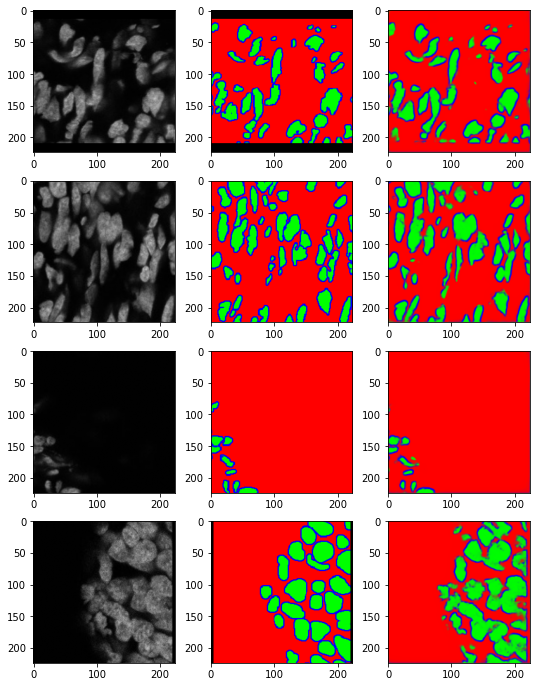

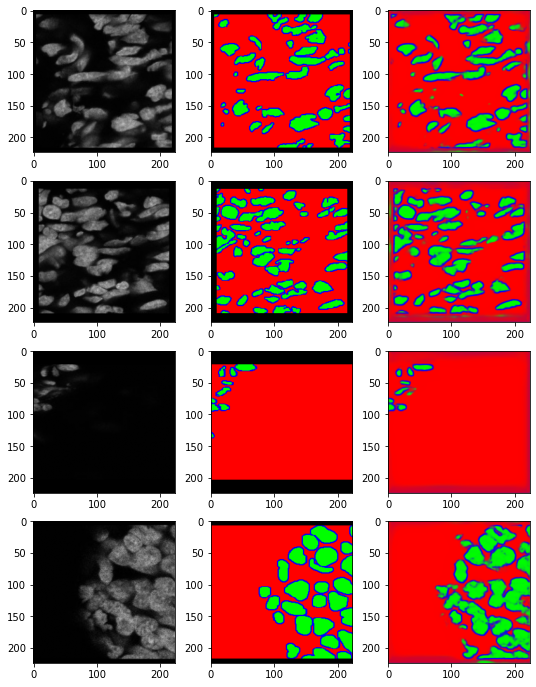

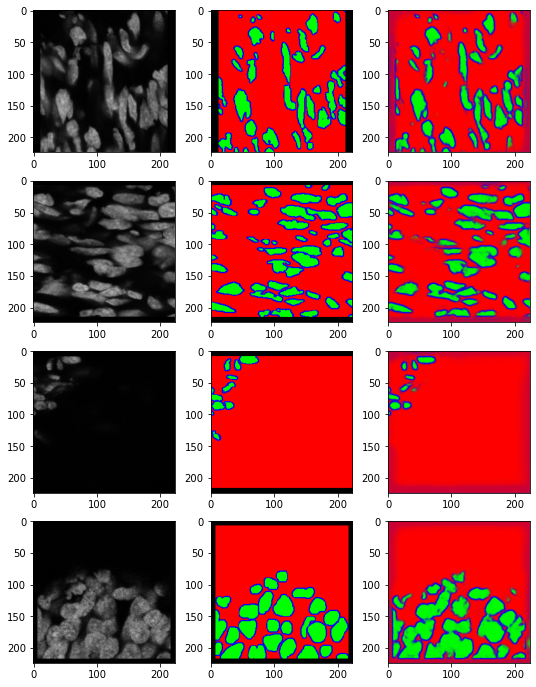

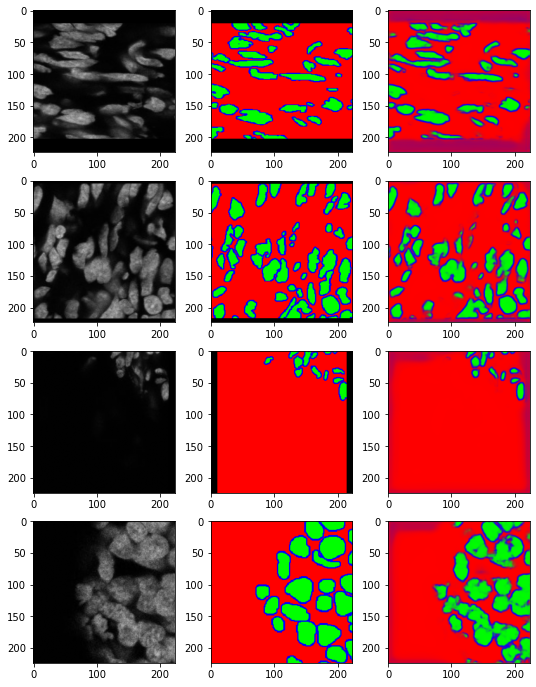

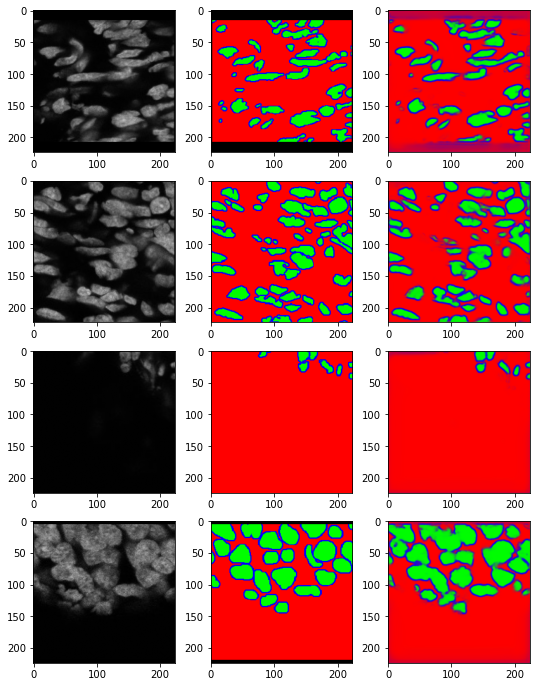

...

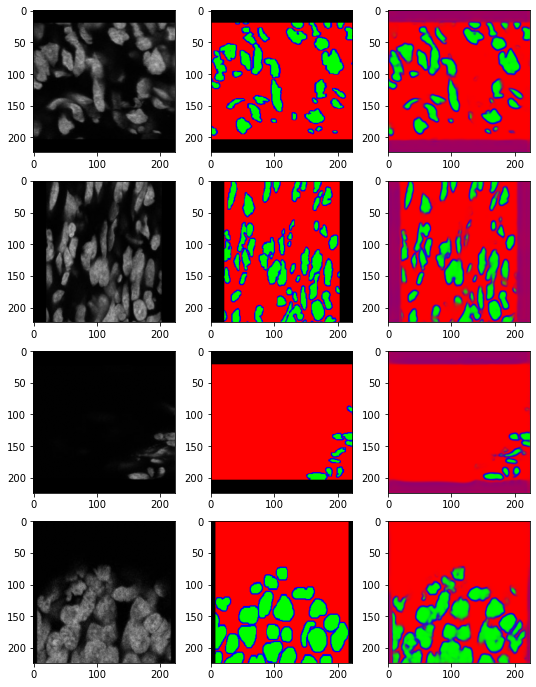

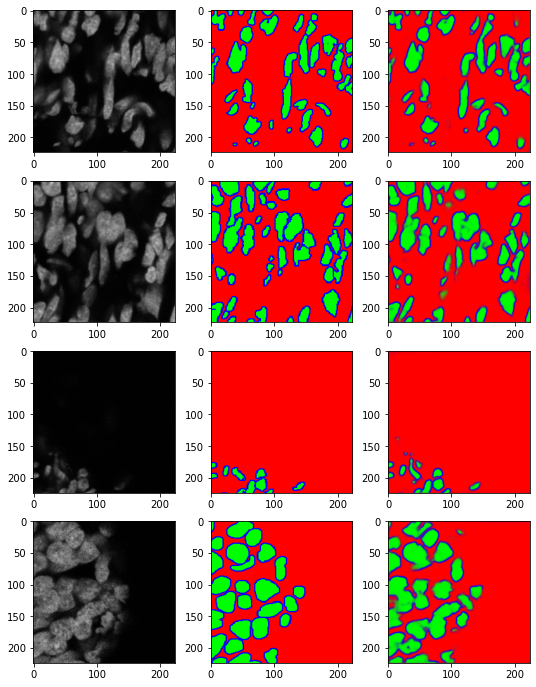

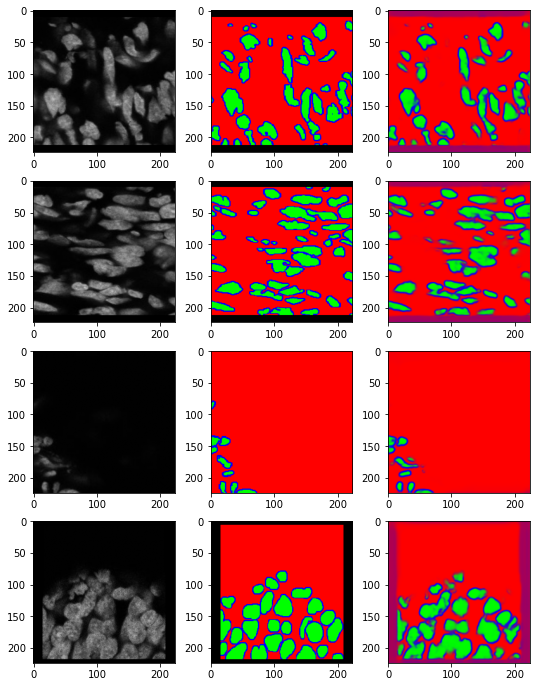

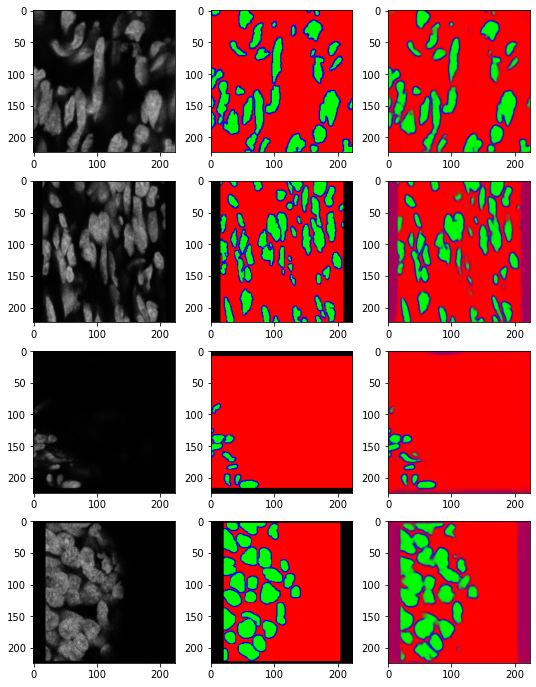

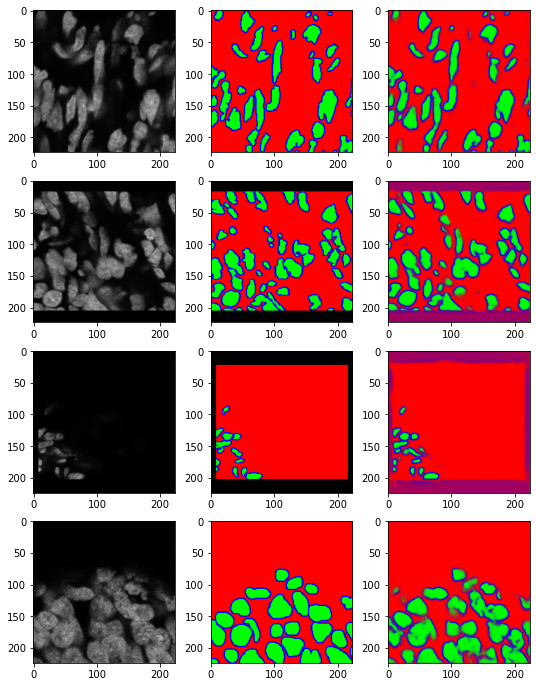

In [57]:
train(generator, discriminator, GAN, gen, valgen)

In [ ]:
model = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)
model.load_weights('../models/model_unet_b0_0412_score_75_bowl.hdf5')
model.compile(optimizer="Adam", loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

root = "/home/nathan/Desktop/data/dl_data/monitoring/"

for i in range(40):
    model.fit(x=gen, validation_data=valgen, epochs=1)
    viz_segment(model, valgen, idx=0, name=f"image_classic_{i}.png")
    model.save_weights(root + f'classic_model_{i}.h5')